In [1]:
# from __future__ import division # uncomment this if using Python 2.7
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
%matplotlib inline

import DSIP_utils as dsip

# Signal filtering

In the previous labs, we introduced the concept of signal analysis in the frequency domain. 

In order to do that we gave the definition of <i>Fourier (inverse) transform</i> and <i>Fourier series</i> decomposition. 

An important question may now arise: <b>why do we care about that?</b> 

The main goal of this lab is to show some of the most important applications of the Fourier theory in signal processing.
In order to do that, let's briefly talk about a new operation.


## Audio signal filtering
We are now going to move toward a real-world application: audio signal filtering. The audio signal of choice is the song <a href="https://www.youtube.com/watch?v=8UVNT4wvIGY">Somebody that I used to know</a> by Gotye feat. Kymbra, 2011. This song presents low frequency components (the bassline is played the same way during the whole song), as well as high frequency ones (a xylophone maybe?) as well as components that show up in basically the every band (Gotye's and Kymbra's voices). Let's listen to this song.

In [5]:
import IPython
IPython.display.Audio("Gotye2011_short.wav",rate=44100)

So far we represented in the frequency domain signals that are really small. Is the Fourier transform as we now it able to give us the frequency representation of an entire song? Let's check it out.

In [6]:
import scipy.io.wavfile as wav
fs, x = wav.read("Gotye2011_short.wav") # This command loads the wavfile as (sample_rate, signal)
N = len(x)

t  = 1/fs * np.arange(N) 
f  = fs/N * np.arange(N)

X = np.fft.fft(x)/N ## compute fft(x)

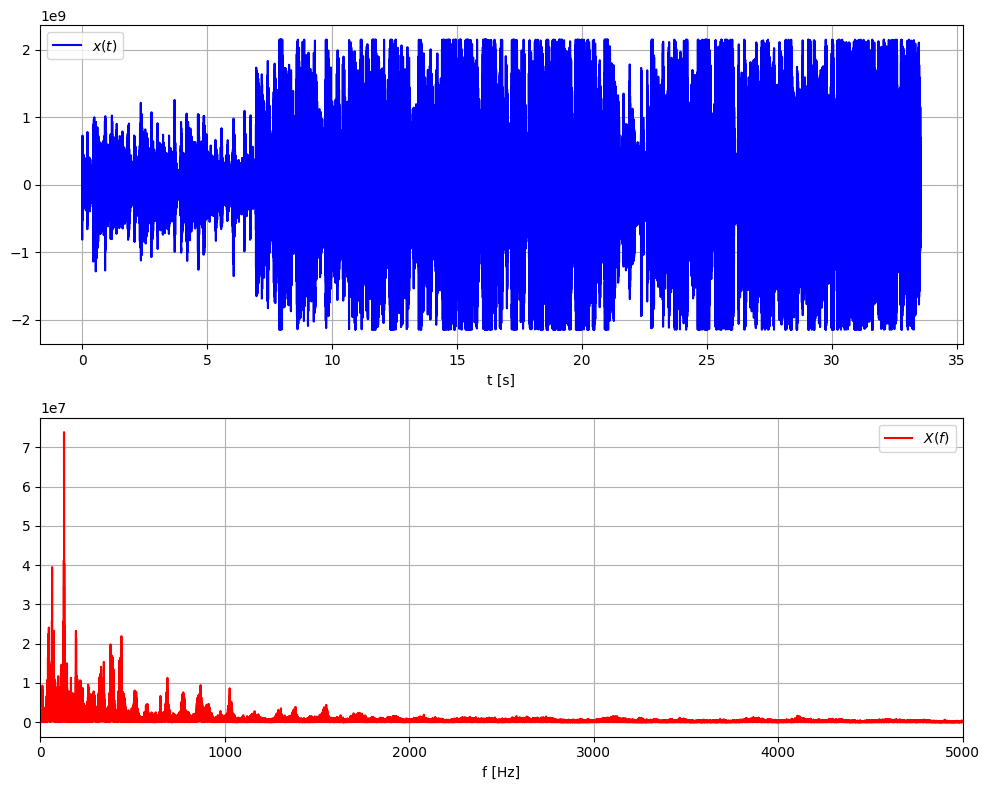

In [8]:
plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.plot(t, x,'-b',label=r"$x(t)$")
plt.xlabel('t [s]')
plt.legend()
plt.grid()

plt.subplot(2,1,2)
plt.plot(f[:N//2],np.abs(X[:N//2]),'-r',label=r"$X(f)$")
plt.xlabel('f [Hz]')
plt.xlim([0,5e3])
plt.legend()
plt.tight_layout()
plt.grid()
plt.savefig('Gotye_spectrum_time_freq.png',)

Cool! But not really handy, right? All the frequencies of this piece of song are plotted together. In those situations we can use a smart tool: the <a href="https://en.wikipedia.org/wiki/Short-time_Fourier_transform">Short-time Fourier transform</a> (aka STFT). As far as we are interested, this is just a repeated Fourier transform on successive chunks of a big input signal. The output of STFT is usually called <a href="https://en.wikipedia.org/wiki/Spectrogram">Spectrogram</a> and it appears as a heatmap having time on the horizontal axis and frequency on the vertical one. This is, obviously, already implemented in the <font style="TrueType">Scipy</font> stack. Check the <a href="http://matplotlib.org/api/pyplot_api.html#matplotlib.pyplot.specgram"><font style="TrueType">plt.specgram</font></a> documentation.

In [9]:
plt.specgram??

Signature:
plt.specgram(
    x: 'ArrayLike',
    *,
    NFFT: 'int | None' = None,
    Fs: 'float | None' = None,
    Fc: 'int | None' = None,
    detrend: "Literal['none', 'mean', 'linear'] | Callable[[ArrayLike], ArrayLike] | None" = None,
    window: 'Callable[[ArrayLike], ArrayLike] | ArrayLike | None' = None,
    noverlap: 'int | None' = None,
    cmap: 'str | Colormap | None' = None,
    xextent: 'tuple[float, float] | None' = None,
    pad_to: 'int | None' = None,
    sides: "Literal['default', 'onesided', 'twosided'] | None" = None,
    scale_by_freq: 'bool | None' = None,
    mode: "Literal['default', 'psd', 'magnitude', 'angle', 'phase'] | None" = None,
    scale: "Literal['default', 'linear', 'dB'] | None" = None,
    vmin: 'float | None' = None,
    vmax: 'float | None' = None,
    data=None,
    **kwargs,
) -> 'tuple[np.ndarray, np.ndarray, np.ndarray, AxesImage]'
Docstring:
Plot a spectrogram.

Compute and plot a spectrogram of data in *x*.  Data are split into
*NFFT* len

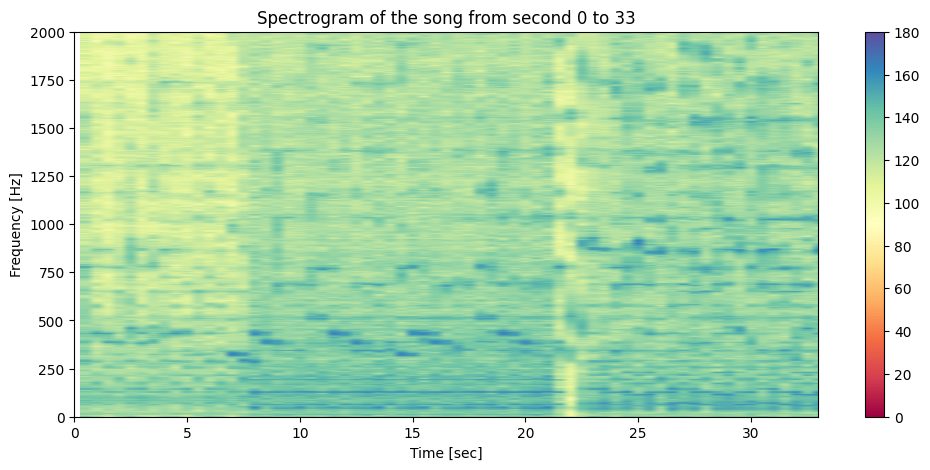

In [10]:
plt.figure(figsize=(12, 5))
Pxx, freqs, bins, im = plt.specgram(x, NFFT = fs, Fs = fs, noverlap = int(fs/2), cmap = plt.cm.Spectral,
                                    mode = 'magnitude', vmin=0, vmax=180) 
Tmin = int(t[0])
Tmax = int(t[-1])
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0,2e3)
plt.xlim(Tmin,Tmax)
plt.title("Spectrogram of the song from second {} to {}".format(Tmin,Tmax))
plt.colorbar();

We can try and filter this piece of song with a low-pass filter with band $B = [0,500]$ Hz. Then check what changes in the spectrum. In order to do that, however, we cannot use the simple tool we saw so far, we need a digital filter. For the ones of you interested in the topic, we can talk about that afterwards.

In [11]:
# Butterworh LP filter definition
Nyquist_f = fs/2
Critical_band = 3000 # Hz
Wn = Critical_band/Nyquist_f
b, a = signal.butter(4, Wn,'low', analog=False)

# Signal filtering
#y = signal.filtfilt(b, a, x)
y = signal.lfilter(b, a, x) ## filtered signal
 
# Fourier transform
Y = np.fft.fft(y) / N ## fft(y)

# plt.figure(figsize=(10, 8))
# plt.subplot(2,1,1)
# plt.plot(t, y[:N],'-b',label=r"$y(t)$")
# plt.xlabel('t [s]')
# plt.legend()
# plt.grid()

# plt.subplot(2,1,2)
# plt.plot(f[:N//2],np.abs(Y[:N//2]),'-r',label=r"$Y(f)$")
# plt.xlabel('f [Hz]')
# plt.xlim([0,5e3])
# plt.legend()
# plt.grid()

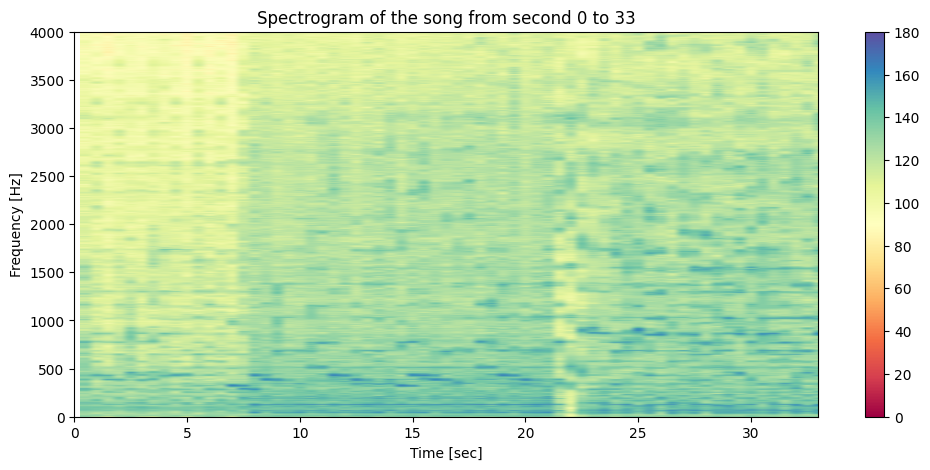

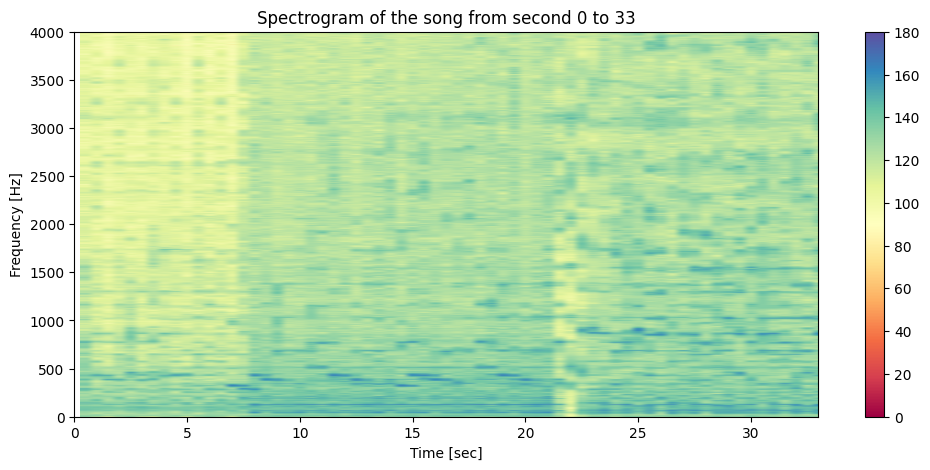

In [12]:
plt.figure(figsize=(12, 5))
Pyy, freqs, bins, im = plt.specgram(y, NFFT = fs, Fs = fs, noverlap = int(fs/2), cmap = plt.cm.Spectral,
                                    mode = 'magnitude', vmin=0, vmax=180) 
Tmin = int(t[0])
Tmax = int(t[-1])
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0,4e3)
plt.xlim(Tmin,Tmax)
plt.title("Spectrogram of the song from second {} to {}".format(Tmin,Tmax))
plt.colorbar();

plt.figure(figsize=(12, 5))
Pxx, freqs, bins, im = plt.specgram(x, NFFT = fs, Fs = fs, noverlap = int(fs/2), cmap = plt.cm.Spectral,
                                    mode = 'magnitude', vmin=0, vmax=180) 


Tmin = int(t[0])
Tmax = int(t[-1])

plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0,4e3)
plt.xlim(Tmin,Tmax)
plt.title("Spectrogram of the song from second {} to {}".format(Tmin,Tmax))
plt.colorbar();

<a href="http://audacityteam.org">Audacity</a> is an awesome free audio editor. It implements a set of easy and reliable filter design tools. I definitely recommend to use such software to perform audio signal filtering.

In [13]:
IPython.display.Audio(y,rate=44100)